#In-silico Digital Breast Tomosynthesis dataset for the comparative analysis of Deep Learning models for tumor segmentation
Cristina Alfaro Vergara, Nicolás Araya, Claudia Prieto and Domingo
Mery

## download dataset

In [ ]:
!wget https://www.dropbox.com/scl/fi/3xc8od72i9952rndkpgmb/dataset_174_nuevo.zip?rlkey=nbf50v4j9snyj4eiyi2o9xv94&st=opo7rjlb&dl=0
!mv /content/dataset_174_nuevo.zip?rlkey=nbf50v4j9snyj4eiyi2o9xv94 dataset_174_nuevo.zip
!unzip -qq dataset_174_nuevo.zip
!rm /content/dataset_174_nuevo.zip

--2024-11-06 20:29:02--  https://www.dropbox.com/scl/fi/3xc8od72i9952rndkpgmb/dataset_174_nuevo.zip?rlkey=nbf50v4j9snyj4eiyi2o9xv94
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc268a828d307520d12f562ae25e.dl.dropboxusercontent.com/cd/0/inline/Cd4Nq3g2gJtuokSgEuUgsVuGxi8XDXv7UgwusXB4qNf5pitfNp4KFlr7UgRz09vIUB2PwGoLBiP0v0fDqYA8S5z0SB10T35O1CByqxc7DYzPv_I-n0TZ0ZnmFORRBS6prso16GqJwbCrhoXSkympwkhv/file# [following]
--2024-11-06 20:29:04--  https://uc268a828d307520d12f562ae25e.dl.dropboxusercontent.com/cd/0/inline/Cd4Nq3g2gJtuokSgEuUgsVuGxi8XDXv7UgwusXB4qNf5pitfNp4KFlr7UgRz09vIUB2PwGoLBiP0v0fDqYA8S5z0SB10T35O1CByqxc7DYzPv_I-n0TZ0ZnmFORRBS6prso16GqJwbCrhoXSkympwkhv/file
Resolving uc268a828d307520d12f562ae25e.dl.dropboxusercontent.com (uc268a828d307520d12f562ae25e.dl.dropboxusercontent.com)... 162.125.

## install libraries

In [ ]:
%%capture
!pip install lightning segmentation-models-pytorch

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, Subset

from torchvision import models
import numpy as np
from PIL import Image

from lightning.pytorch.loggers import WandbLogger
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import ModelCheckpoint

from torch.optim import lr_scheduler

import os
import segmentation_models_pytorch as smp
import lightning as L

import torch.nn.functional as F
import matplotlib.pyplot as plt
import fnmatch

from   skimage.color import label2rgb
from sklearn.model_selection import StratifiedShuffleSplit



from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights



device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device:', device)

Device: cuda


##Dataset customize

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        """
        Initializes the CustomDataset class.

        Args:
            image_dir (str): Path to the directory containing image files.
            mask_dir (str): Path to the directory containing mask files.
            transform (callable, optional): Transformations to apply to images and masks.

        Attributes:
            image_files (list): Sorted list of image file names in `image_dir`.
            mask_files (list): Sorted list of mask file names in `mask_dir`.
            labels (np.ndarray): Array of labels extracted from the mask files.
        """
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform

        # Collect all image and mask file names and sort them
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.tif')])
        self.mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.tif')])

        # Ensure the number of images matches the number of masks
        assert len(self.image_files) == len(self.mask_files), "The number of images and masks must match."

        # Extract labels from the masks
        self.labels = self._extract_labels_from_masks()

    def _extract_labels_from_masks(self):
        """
        Extracts unique labels from the mask files.

        Returns:
            np.ndarray: Array of labels derived from the masks.
        """
        labels = []
        for mask_file in self.mask_files:
            mask_path = os.path.join(self.mask_dir, mask_file)
            mask = Image.open(mask_path).convert('L')  # Open mask and convert it to grayscale
            mask_array = np.array(mask)  # Convert the mask to a NumPy array
            unique_values = np.unique(mask_array)  # Get unique pixel values

            # If masks are binary, use the predominant value for labeling
            if len(unique_values) > 1:
                label = unique_values[1]  # Assume the second value is relevant
            else:
                label = unique_values[0]  # Use the single unique value

            labels.append(label)

        return np.array(labels)

    def __len__(self):
        """
        Returns the total number of samples in the dataset.

        Returns:
            int: Number of image-mask pairs.
        """
        return len(self.image_files)

    def __getitem__(self, idx):
        """
        Retrieves the image and mask at the specified index.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            tuple: A tuple containing the image and its corresponding mask.
        """
        # Get the file paths for the image and mask
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])

        # Open the image and mask as grayscale
        image = Image.open(image_path).convert('L')
        mask = Image.open(mask_path).convert('L')

        # Apply transformations if specified
        if self.transform:
            if image:
                image = self.transform(image)
            if mask:
                mask = self.transform(mask)

        return image, mask


In [ ]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize images and masks to 128x128 resolution
    transforms.ToTensor(),         # Convert PIL images to PyTorch tensors
    # transforms.RandomHorizontalFlip(p=0.5),  # Optionally apply random horizontal flipping
])

image_dir = "dataset_174_nuevo/images"  # Directory containing the image files
mask_dir = "dataset_174_nuevo/masks"    # Directory containing the mask files
dataset = CustomDataset(image_dir, mask_dir, transform=transform)

labels = dataset.labels  # Extract the precomputed labels from the dataset

(-0.5, 127.5, 127.5, -0.5)

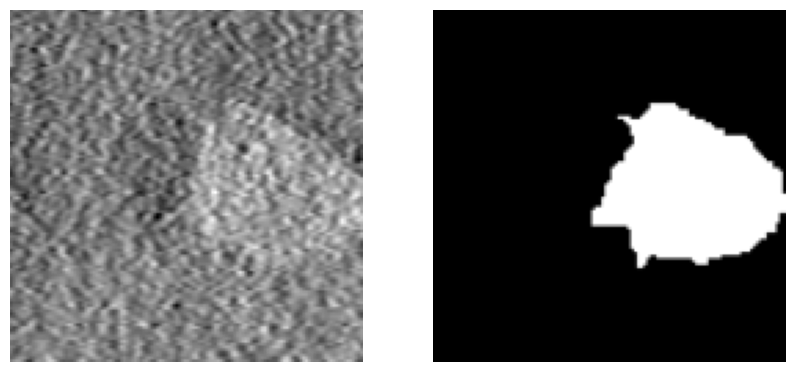

In [ ]:
# Retrieve the image and mask from the dataset at index 140
img, mask = dataset.__getitem__(140)

# Create a figure with two subplots (one for the image and one for the mask)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns, with a figure size of 10x5 inches

# Display the image in the first subplot
axes[0].imshow(img.permute(1, 2, 0).numpy(), cmap="gray")  # Convert tensor (C, H, W) to (H, W, C) for display
axes[0].axis('off')  # Disable axes for a cleaner display

# Display the mask in the second subplot
axes[1].imshow(mask.permute(1, 2, 0).numpy(), cmap="gray")  # Similarly adjust the tensor dimensions and show in grayscale
axes[1].axis('off')  # Disable axes for a cleaner display


In [ ]:
# Configure StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
# Creates a stratified splitter that maintains the distribution of labels across splits.
# - n_splits=5: Number of re-shuffling splits.
# - test_size=0.2: 20% of the dataset will be used as the test set.
# - random_state=42: Ensures reproducibility of the split.

# Perform the first split: Train/Validation + Test
train_val_indices, test_indices = next(split.split(np.zeros(len(labels)), labels))
# Splits the dataset into training/validation (80%) and testing (20%).
# `np.zeros(len(labels))`: Placeholder input for features since only labels are used for stratification.

# Perform the second split: Train and Validation
train_indices, val_indices = next(split.split(np.zeros(len(train_val_indices)), labels[train_val_indices]))
# Splits the training/validation set into separate training (80%) and validation (20%) subsets,
# maintaining the label distribution within the train/validation indices.

# Create subsets for train, validation, and test
train_dataset = Subset(dataset, train_indices)
# `train_dataset` contains only the data corresponding to the indices in `train_indices`.

val_dataset = Subset(dataset, val_indices)
# `val_dataset` contains only the data corresponding to the indices in `val_indices`.

test_dataset = Subset(dataset, test_indices)
# `test_dataset` contains only the data corresponding to the indices in `test_indices`.

# Create data loaders for the subsets
train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers=os.cpu_count())
# DataLoader for training:
# - `batch_size=20`: Each batch will contain 20 samples.
# - `shuffle=True`: Shuffles the data for each epoch to enhance training generalization.
# - `num_workers=os.cpu_count()`: Utilizes the maximum number of available CPU cores for data loading.

val_loader = DataLoader(val_dataset, batch_size=20, shuffle=False, num_workers=os.cpu_count())
# DataLoader for validation:
# - No shuffling as the data order is not critical for validation.

test_loader = DataLoader(test_dataset, batch_size=20, shuffle=False, num_workers=os.cpu_count())
# DataLoader for testing:
# - Similarly, no shuffling to ensure consistency in results.


In [ ]:
EPOCHS = 100
T_MAX = EPOCHS * len(train_loader)


##Unet model

In [ ]:
class Block(nn.Module):
    def __init__(self, inputs = 1, middles = 64, outs = 64):
        super().__init__()

        self.conv1 = nn.Conv2d(inputs, middles, 3, 1, 1)
        self.conv2 = nn.Conv2d(middles, outs, 3, 1, 1)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm2d(outs)
        self.pool = nn.MaxPool2d(2, 2)

    def forward(self, x):

        x = self.relu(self.conv1(x))
        x = self.relu(self.bn(self.conv2(x)))
        # e1 = x
        # x = self.pool(x)

        return self.pool(x), x
        # self.pool(x): [bs, out, h*.5, w*.5]
        # x: [bs, out, h, w]

        # return x, e1
        # x: [bs, out, h*.5, w*.5]
        # e1: [bs, out, h, w]

In [ ]:
class UNet(nn.Module):
    def __init__(self,):
        super().__init__()
        #self.device = device
        #self.dropout = nn.Dropout(dropout)

        self.en1 = Block(1, 64, 64)
        self.en2 = Block(64, 128, 128)
        self.en3 = Block(128, 256, 256)
        self.en4 = Block(256, 512, 512)
        self.en5 = Block(512, 1024, 512)

        self.upsample4 = nn.ConvTranspose2d(512, 512, 2, stride = 2)
        self.de4 = Block(1024, 512, 256)

        self.upsample3 = nn.ConvTranspose2d(256, 256, 2, stride = 2)
        self.de3 = Block(512, 256, 128)

        self.upsample2 = nn.ConvTranspose2d(128, 128, 2, stride = 2)
        self.de2 = Block(256, 128, 64)

        self.upsample1 = nn.ConvTranspose2d(64, 64, 2, stride = 2)
        self.de1 = Block(128, 64, 64)

        self.conv_last = nn.Conv2d(64, 1, kernel_size=1, stride = 1, padding = 0)

    def forward(self, x):
        # x: [bs, 3, 256, 256]

        x, e1 = self.en1(x)
        # x: [bs, 64, 128, 128]
        # e1: [bs, 64, 256, 256]
        #print(f"enc 1: x:{x.shape} - e1:{e1.shape}" )

        x, e2 = self.en2(x)
        # x: [bs, 128, 64, 64]
        # e2: [bs, 128, 128, 128]
        #print(f"enc 2: x:{x.shape} - e2:{e2.shape}" )

        x, e3 = self.en3(x)
        # x: [bs, 256, 32, 32]
        # e3: [bs, 256, 64, 64]
        #print(f"encv3: x:{x.shape} - e3:{e3.shape}" )

        x, e4 = self.en4(x)
        # x: [bs, 512, 16, 16]
        # e4: [bs, 512, 32, 32]
        #print(f"encv4: x:{x.shape} - e4:{e4.shape}" )

        _, x = self.en5(x)
        # x: [bs, 512, 16, 16]
        #print(f"encv5: x:{x.shape}" )

        x = self.upsample4(x)
        # x: [bs, 512, 32, 32]
        #print(f"upsample 4: x:{x.shape}" )
        x = torch.cat([x, e4], dim=1)
        # x: [bs, 1024, 32, 32]
        _,  x = self.de4(x)
        #print(f"dec 4: x:{x.shape}" )
        # x: [bs, 256, 32, 32]

        x = self.upsample3(x)
        #print(f"dec 3: x:{x.shape}" )
        # x: [bs, 256, 64, 64]
        x = torch.cat([x, e3], dim=1)
        # x: [bs, 512, 64, 64]
        _, x = self.de3(x)
        # x: [bs, 128, 64, 64]

        x = self.upsample2(x)
        # x: [bs, 128, 128, 128]
        x = torch.cat([x, e2], dim=1)
        # x: [bs, 256, 128, 128]
        _, x = self.de2(x)
        # x: [bs, 64, 128, 128]

        x = self.upsample1(x)
        # x: [bs, 64, 256, 256]
        x = torch.cat([x, e1], dim=1)
        # x: [bs, 128, 256,256, 256
        _, x = self.de1(x)
        # x: [bs, 64, 256, 256]

        x = self.conv_last(x)
        # x: [bs, 1, 256, 256]

        # x = x.squeeze(1)
        return x

In [ ]:
class UNETModel(L.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = UNet()
        self.loss_fn = torch.nn.BCEWithLogitsLoss()


        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, image):
        mask = self.model(image)
        return mask

    def shared_step(self, batch, stage):
        image = batch[0]
        mask = batch[1]

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        # Log metrics
        self.log_dict(metrics, prog_bar=True)

        # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
      return torch.optim.Adam(self.parameters(), lr=1e-4)


    def save_test_metrics(self):
        test_df = pd.DataFrame({
            "model": ["unet"],
            "test_precision": [self.test_metrics[0]['test_precision'].item()],
            "test_recall": [self.test_metrics[0]['test_recall'].item()],
            "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
            "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
            "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
            "test_loss": [self.test_metrics[0]['test_loss']],
            "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
            })
        # Save to CSV files
        test_df.to_csv("unet_test_metrics.csv", index=False)

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint
# model
unet_model = UNETModel().to(device)

early_stop = EarlyStopping(monitor= "valid_f1_score",
                           min_delta=0.00,
                           patience = 20,
                           verbose=True,
                           mode="max")
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='unet-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # save model with best valid_f1_score value
                                       save_top_k=1,  # save best model
                                       )
## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[early_stop, SWA,checkpoint_callback]
    )


trainer.fit(model=unet_model, train_dataloaders=train_loader,val_dataloaders=val_loader)
trainer.test(unet_model, dataloaders=test_loader)
# Guardar métricas
unet_model.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | UNet              | 23.4 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
23.4 M    Trainable params
0         Non-trainable params
23.4 M    Tot

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.001
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.001


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.259 >= min_delta = 0.0. New best score: 0.260
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.259 >= min_delta = 0.0. New best score: 0.260


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.253 >= min_delta = 0.0. New best score: 0.513
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.253 >= min_delta = 0.0. New best score: 0.513


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.197 >= min_delta = 0.0. New best score: 0.710
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.197 >= min_delta = 0.0. New best score: 0.710


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.729
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.729


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.054 >= min_delta = 0.0. New best score: 0.783
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.054 >= min_delta = 0.0. New best score: 0.783


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.785
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.785


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.804
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.804


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.811
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.811


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.840
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.840


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.840
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.840


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.851
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.851


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.858
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.858


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.858. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.858. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9859706163406372     │
│     test_dataset_iou      │    0.8612404465675354     │
│       test_f1_score       │    0.9254478216171265     │
│         test_loss         │    0.20335498452186584    │
│    test_per_image_iou     │    0.8513419032096863     │
│      test_precision       │    0.9166727662086487     │
│        test_recall        │     0.934392511844635     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    unet_model.eval()
    logits = unet_model(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()

'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    unet_model.eval()\n    logits = unet_model(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs[i, 2].axi

## FCN resnet 50

In [ ]:
class FCN50(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.fcn_resnet50(pretrained=False, num_classes=1)

        self.model = models.segmentation.fcn_resnet50(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN50"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn50_test_metrics.csv", index=False)



In [ ]:
model_fcn50 = FCN50().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn50-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )
# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA, checkpoint_callback])

trainer.fit(model_fcn50, train_loader, val_loader)
trainer.test(model_fcn50, dataloaders=test_loader)
model_fcn50.save_test_metrics()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 228MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | FCN               | 32.9 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
32.9 M    Trainable 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.082 >= min_delta = 0.0. New best score: 0.082
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.082 >= min_delta = 0.0. New best score: 0.082


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.179 >= min_delta = 0.0. New best score: 0.262
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.179 >= min_delta = 0.0. New best score: 0.262


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.353 >= min_delta = 0.0. New best score: 0.615
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.353 >= min_delta = 0.0. New best score: 0.615


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.056 >= min_delta = 0.0. New best score: 0.671
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.056 >= min_delta = 0.0. New best score: 0.671


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.689
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.689


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.695
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.695


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.698
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.698


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.715
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.715


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.723
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.723


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.729
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.729


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.731
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.731


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.733
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.733


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.740
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.740


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.742
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.742


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.742
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.742


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.743
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.743


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.751
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.751


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.753
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.753


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.760
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.760


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.762
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.762


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.762. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.762. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9830723404884338     │
│     test_dataset_iou      │    0.8303980231285095     │
│       test_f1_score       │     0.907341480255127     │
│         test_loss         │   0.054118603467941284    │
│    test_per_image_iou     │    0.8322812914848328     │
│      test_precision       │    0.9260550737380981     │
│        test_recall        │    0.8893691897392273     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_fcn50.eval()
    logits = model_fcn50(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''


'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_fcn50.eval()\n    logits = model_fcn50(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs[i, 2].a

## FCN resnet 101

In [ ]:

class FCN101(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.fcn_resnet50(pretrained=False, num_classes=1)

        self.model = models.segmentation.fcn_resnet101(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):


      test_df = pd.DataFrame({
          "model": ["FCN101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn101_test_metrics.csv", index=False)




In [ ]:
model_fcn101 = FCN101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)


checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn101-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= 100,
    callbacks=[ early_stop,checkpoint_callback,SWA])

trainer.fit(model_fcn101, train_loader, val_loader)
trainer.test(model_fcn101, dataloaders=test_loader)
model_fcn101.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | FCN               | 51.9 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
51.9 M    Trainable params
0         Non-trainable params
51.9 M    Total params
207.731   Total estimated model params size (MB)
293       Modules in train mode
0         Modules in eval mode
INFO:lightni

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.126 >= min_delta = 0.0. New best score: 0.126
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.126 >= min_delta = 0.0. New best score: 0.126


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.157
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.157


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.222 >= min_delta = 0.0. New best score: 0.379
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.222 >= min_delta = 0.0. New best score: 0.379


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.187 >= min_delta = 0.0. New best score: 0.567
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.187 >= min_delta = 0.0. New best score: 0.567


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.073 >= min_delta = 0.0. New best score: 0.640
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.073 >= min_delta = 0.0. New best score: 0.640


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.060 >= min_delta = 0.0. New best score: 0.700
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.060 >= min_delta = 0.0. New best score: 0.700


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.035 >= min_delta = 0.0. New best score: 0.735
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.035 >= min_delta = 0.0. New best score: 0.735


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.747
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.747


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.751
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.751


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.754
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.754


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.762
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.762


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.762. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.762. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9831908941268921     │
│     test_dataset_iou      │     0.831506609916687     │
│       test_f1_score       │    0.9080028533935547     │
│         test_loss         │    0.05629274994134903    │
│    test_per_image_iou     │    0.8499781489372253     │
│      test_precision       │     0.926601231098175     │
│        test_recall        │    0.8901364207267761     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_fcn101.eval()
    logits = model_fcn101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_fcn101.eval()\n    logits = model_fcn101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs[i, 2]

## FCN resnet (50 Pretrained)

In [ ]:

from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights

class FCN50P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.fcn_resnet50(weights='DEFAULT')

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN50 Pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn50_pretrained_test_metrics.csv", index=False)




In [ ]:
model_fcn50_ft = FCN50P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn50pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= 100,
    callbacks=[ early_stop, SWA, checkpoint_callback])

trainer.fit(model_fcn50_ft, train_loader, val_loader)
trainer.test(model_fcn50_ft, dataloaders=test_loader)
model_fcn50_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth
100%|██████████| 135M/135M [00:00<00:00, 225MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | FCN               | 35.3 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
35.3

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.015
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.015


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.028 >= min_delta = 0.0. New best score: 0.043
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.028 >= min_delta = 0.0. New best score: 0.043


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.114 >= min_delta = 0.0. New best score: 0.157
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.114 >= min_delta = 0.0. New best score: 0.157


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.229 >= min_delta = 0.0. New best score: 0.386
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.229 >= min_delta = 0.0. New best score: 0.386


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.278 >= min_delta = 0.0. New best score: 0.664
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.278 >= min_delta = 0.0. New best score: 0.664


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.081 >= min_delta = 0.0. New best score: 0.745
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.081 >= min_delta = 0.0. New best score: 0.745


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.752
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.752


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.753
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.753


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.761
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.761


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_fcn50_ft.eval()
    logits = model_fcn50(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_fcn50_ft.eval()\n    logits = model_fcn50(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs[i, 2

## FCN resnet (101 Pretrained)

In [ ]:

class FCN101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.fcn_resnet101(weights='DEFAULT')

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN101 Pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_fcn101_ft = FCN101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn101pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_fcn101_ft, train_loader, val_loader)
trainer.test(model_fcn101_ft, dataloaders=test_loader)
model_fcn101_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/fcn_resnet101_coco-7ecb50ca.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet101_coco-7ecb50ca.pth
100%|██████████| 208M/208M [00:00<00:00, 225MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | FCN               | 54.3 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
54.3 M    Trainable params
0         Non-trainable params
54.3 M    Total params
217.192   Total estimated model params size (MB)
299       Modules in train 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.144
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.144


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.145
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.145


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.088 >= min_delta = 0.0. New best score: 0.233
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.088 >= min_delta = 0.0. New best score: 0.233


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.109 >= min_delta = 0.0. New best score: 0.342
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.109 >= min_delta = 0.0. New best score: 0.342


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.303 >= min_delta = 0.0. New best score: 0.645
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.303 >= min_delta = 0.0. New best score: 0.645


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.042 >= min_delta = 0.0. New best score: 0.687
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.042 >= min_delta = 0.0. New best score: 0.687


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.709
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.709


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.718
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.718


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.720
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.720


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.729
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.729


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.731
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.731


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.742
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.742


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.742
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.742


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.742. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.742. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9797380566596985     │
│     test_dataset_iou      │    0.7971189022064209     │
│       test_f1_score       │    0.8871076107025146     │
│         test_loss         │    0.10949654877185822    │
│    test_per_image_iou     │    0.7778242826461792     │
│      test_precision       │    0.9225779175758362     │
│        test_recall        │    0.8542637228965759     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_fcn101_ft.eval()
    logits = model_fcn50(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_fcn101_ft.eval()\n    logits = model_fcn50(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs[i, 

## DEEPLABV3 resnet 50

In [ ]:
class DeepLabv350(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=1)
        #self.model = models.segmentation.deeplabv3_resnet101(pretrained=False, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv350"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv350_test_metrics.csv", index=False)



In [ ]:
model_deeplab50 = DeepLabv350().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab50, train_loader, val_loader)
trainer.test(model_deeplab50, dataloaders=test_loader)
model_deeplab50.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3         | 39.6 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
39.6 M    Trainable params
0         Non-trainable params
39.6 M    Total params
158.510   Total estimated model params size (MB)
184       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | D

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.208
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.208


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.078 >= min_delta = 0.0. New best score: 0.286
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.078 >= min_delta = 0.0. New best score: 0.286


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.273 >= min_delta = 0.0. New best score: 0.559
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.273 >= min_delta = 0.0. New best score: 0.559


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.139 >= min_delta = 0.0. New best score: 0.698
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.139 >= min_delta = 0.0. New best score: 0.698


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.711
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.711


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.717
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.717


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.731
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.731


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.739
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.739


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.742
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.742


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.759
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.759


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.767
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.767


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.774
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.774


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.774. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.774. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9832816123962402     │
│     test_dataset_iou      │    0.8339769840240479     │
│       test_f1_score       │    0.9094737768173218     │
│         test_loss         │    0.07323489338159561    │
│    test_per_image_iou     │    0.8293062448501587     │
│      test_precision       │    0.9179246425628662     │
│        test_recall        │    0.9011770486831665     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplab50.eval()
    logits = model_deeplab50(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()

'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplab50.eval()\n    logits = model_deeplab50(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    axs

## DEEPLABV3 101

In [ ]:
class DeepLabv3101(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=1)
        self.model = models.segmentation.deeplabv3_resnet101(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3101_test_metrics.csv", index=False)




In [ ]:
model_deeplab101 = DeepLabv3101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv3101-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab101, train_loader, val_loader)
trainer.test(model_deeplab101, dataloaders=test_loader)
model_deeplab101.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3         | 58.6 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
58.6 M    Trainable params
0         Non-trainable params
58.6 M    Total params
234.479   Total estimated model params size (MB)
320       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | D

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.255
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.255


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.368 >= min_delta = 0.0. New best score: 0.623
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.368 >= min_delta = 0.0. New best score: 0.623


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.077 >= min_delta = 0.0. New best score: 0.700
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.077 >= min_delta = 0.0. New best score: 0.700


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.747
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.747


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.756
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.756


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.773
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.773


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.773. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.773. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9826834797859192     │
│     test_dataset_iou      │    0.8307540416717529     │
│       test_f1_score       │    0.9075539708137512     │
│         test_loss         │    0.07704252749681473    │
│    test_per_image_iou     │    0.7993147969245911     │
│      test_precision       │    0.9030476808547974     │
│        test_recall        │      0.9121053814888      │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplab101.eval()
    logits = model_deeplab101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplab101.eval()\n    logits = model_deeplab101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    a

## DEEPLABV3 resnet 50 (pretrained)

In [ ]:
class DeepLabv350P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.deeplabv3_resnet50(weights='DEFAULT')
        #self.model = models.segmentation.deeplabv3_resnet101(pretrained=False, num_classes=1)

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )
        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):
      test_df = pd.DataFrame({
          "model": ["DeepLabv350 finetuned"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv350_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplab50_ft = DeepLabv350P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab50_ft, train_loader, val_loader)
trainer.test(model_deeplab50_ft, dataloaders=test_loader)
model_deeplab50_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:02<00:00, 71.9MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3         | 42.0 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
42.0 M    Tr

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.050
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.050


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.073 >= min_delta = 0.0. New best score: 0.123
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.073 >= min_delta = 0.0. New best score: 0.123


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.123
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.123


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.126
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.126


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.142
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.142


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.152
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.152


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.080 >= min_delta = 0.0. New best score: 0.232
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.080 >= min_delta = 0.0. New best score: 0.232


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.121 >= min_delta = 0.0. New best score: 0.353
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.121 >= min_delta = 0.0. New best score: 0.353


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.255 >= min_delta = 0.0. New best score: 0.608
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.255 >= min_delta = 0.0. New best score: 0.608


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.155 >= min_delta = 0.0. New best score: 0.763
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.155 >= min_delta = 0.0. New best score: 0.763


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.782
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.782


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.796
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.796


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.798
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.798


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.798. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.798. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9815534353256226     │
│     test_dataset_iou      │    0.8224899768829346     │
│       test_f1_score       │    0.9026002883911133     │
│         test_loss         │    0.14985354244709015    │
│    test_per_image_iou     │    0.7933223247528076     │
│      test_precision       │     0.888480007648468     │
│        test_recall        │    0.9171766042709351     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplab50_ft.eval()
    logits = model_deeplab50(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
plt.savefig('images_and_masks.png', bbox_inches='tight')
plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''


'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplab50_ft.eval()\n    logits = model_deeplab50(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n    

## DEEPLABV3 101(pretrained)

In [ ]:
class DeepLabv3101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=1)
        self.model = models.segmentation.deeplabv3_resnet101(weights='DEFAULT')



        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )
        # Define the loss function
        self.loss_fn = torch.nn.BCEWithLogitsLoss()

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3101 finetuned"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplab101_ft = DeepLabv3101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv3101_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback]
    )

trainer.fit(model_deeplab101_ft, train_loader, val_loader)
trainer.test(model_deeplab101_ft, dataloaders=test_loader)
model_deeplab101_ft.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3         | 61.0 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
61.0 M    Trainable params
0         Non-trainable params
61.0 M    Total params
243.939   Total estimated model params size (MB)
326       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | D

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.261 >= min_delta = 0.0. New best score: 0.261
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.261 >= min_delta = 0.0. New best score: 0.261


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.291
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.291


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.210 >= min_delta = 0.0. New best score: 0.501
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.210 >= min_delta = 0.0. New best score: 0.501


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.034 >= min_delta = 0.0. New best score: 0.536
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.034 >= min_delta = 0.0. New best score: 0.536


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.143 >= min_delta = 0.0. New best score: 0.678
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.143 >= min_delta = 0.0. New best score: 0.678


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.037 >= min_delta = 0.0. New best score: 0.715
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.037 >= min_delta = 0.0. New best score: 0.715


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.726
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.726


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.730
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.730


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.020 >= min_delta = 0.0. New best score: 0.750
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.020 >= min_delta = 0.0. New best score: 0.750


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.754
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.754


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.754. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.754. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9807808995246887     │
│     test_dataset_iou      │    0.8143925070762634     │
│       test_f1_score       │     0.897702693939209     │
│         test_loss         │    0.12902452051639557    │
│    test_per_image_iou     │    0.8089263439178467     │
│      test_precision       │     0.890618085861206     │
│        test_recall        │    0.9049009084701538     │
└───────────────────────────┴───────────────────────────┘

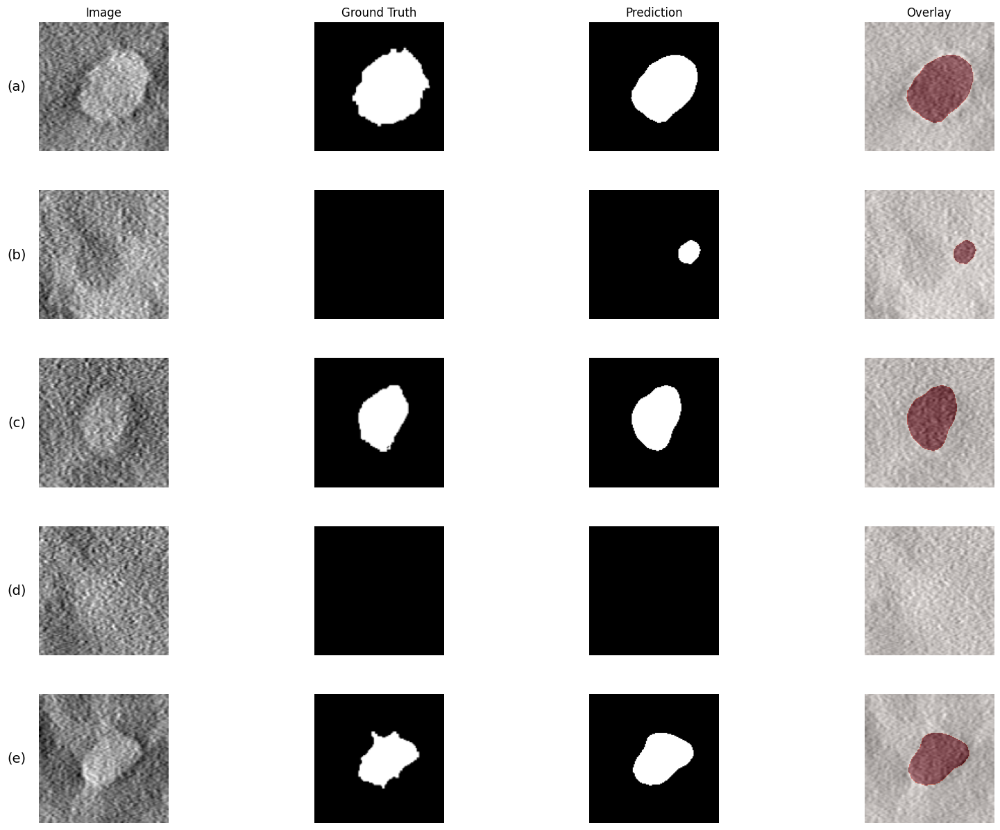

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplab101_ft.eval()
    logits = model_deeplab101_ft(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
#plt.savefig('images_and_masks.png', bbox_inches='tight')
#plt.savefig('images_and_masks.pdf', bbox_inches='tight')
#plt.show()


##Deeplabv3+ resnet50


In [ ]:
class DeepLabv3plus50(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet50',in_channels=1,encoder_weights=None,classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = torch.nn.BCEWithLogitsLoss()


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus resnet50"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus50_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus50 = DeepLabv3plus50().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)


checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350plus-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus50, train_loader, val_loader)
trainer.test(model_deeplabv3plus50, dataloaders=test_loader)
model_deeplabv3plus50.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3Plus     | 26.7 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
26.7 M    Trainable params
0         Non-trainable params
26.7 M    Total params
106.685   Total estimated model params size (MB)
208       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | D

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.324
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.324


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.113 >= min_delta = 0.0. New best score: 0.436
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.113 >= min_delta = 0.0. New best score: 0.436


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.115 >= min_delta = 0.0. New best score: 0.551
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.115 >= min_delta = 0.0. New best score: 0.551


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.053 >= min_delta = 0.0. New best score: 0.604
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.053 >= min_delta = 0.0. New best score: 0.604


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.616
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.616


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.622
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.622


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.637
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.637


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.647
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.647


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.653
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.653


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.662
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.662


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.670
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.670


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.675
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.675


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.675. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.675. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9699131846427917     │
│     test_dataset_iou      │    0.7370530962944031     │
│       test_f1_score       │    0.8486247062683105     │
│         test_loss         │    0.11542952060699463    │
│    test_per_image_iou     │    0.7105851173400879     │
│      test_precision       │    0.7988799810409546     │
│        test_recall        │    0.9049757719039917     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplabv3plus50.eval()
    logits = model_deeplab101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
#plt.savefig('images_and_masks.png', bbox_inches='tight')
#plt.savefig('images_and_masks.pdf', bbox_inches='tight')
#plt.show()
'''

'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplabv3plus50.eval()\n    logits = model_deeplab101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\n

##Deeplabv3+ resnet101


In [ ]:
class DeepLabv3plus101(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet101',in_channels=1,encoder_weights=None,classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = torch.nn.BCEWithLogitsLoss()


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus resnet101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus101_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus101 = DeepLabv3plus101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv3101plus-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus101, train_loader, val_loader)
trainer.test(model_deeplabv3plus101, dataloaders=test_loader)
model_deeplabv3plus101.save_test_metrics()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3Plus     | 45.7 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
45.7 M    Trainable params
0         Non-trainable params
45.7 M    Total params
182.654   Total estimated model params size (MB)
344       Modules in train mode
0         Modules in eval mode
INFO:lightni

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.337 >= min_delta = 0.0. New best score: 0.337
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.337 >= min_delta = 0.0. New best score: 0.337


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.041 >= min_delta = 0.0. New best score: 0.378
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.041 >= min_delta = 0.0. New best score: 0.378


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.105 >= min_delta = 0.0. New best score: 0.482
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.105 >= min_delta = 0.0. New best score: 0.482


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.550
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.550


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.571
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.571


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.585
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.585


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.596
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.596


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.619
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.619


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.625
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.625


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.633
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.633


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.644
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.644


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.648
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.648


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.025 >= min_delta = 0.0. New best score: 0.674
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.025 >= min_delta = 0.0. New best score: 0.674


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.688
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.688


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.694
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.694


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.694
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.694


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.700
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.700


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.709
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.709


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.709
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.709


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.710
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.710


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.728
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.728


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.752
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.752


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.755
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.755


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.755. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.755. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9696794748306274     │
│     test_dataset_iou      │    0.7105736136436462     │
│       test_f1_score       │    0.8308015465736389     │
│         test_loss         │    0.0949317216873169     │
│    test_per_image_iou     │    0.7213363647460938     │
│      test_precision       │    0.8654758334159851     │
│        test_recall        │    0.7987986207008362     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplabv3plus101.eval()
    logits = model_deeplab101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
#plt.savefig('images_and_masks.png', bbox_inches='tight')
#plt.savefig('images_and_masks.pdf', bbox_inches='tight')
#plt.show()
'''


'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplabv3plus101.eval()\n    logits = model_deeplab101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")\

##Deeplabv3+ resnet50 pretrained


In [ ]:
class DeepLabv3plus50P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet50',in_channels=1,encoder_weights='imagenet',classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = torch.nn.BCEWithLogitsLoss()


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus50 pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus50_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus50_ft = DeepLabv3plus50P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv350plus_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus50_ft, train_loader, val_loader)
trainer.test(model_deeplabv3plus50_ft, dataloaders=test_loader)
model_deeplabv3plus50_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 258MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3Plus     | 26.7 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
26.7 M    Trainable params
0         Non-trainable params
26.7 M    Total params
106.685   Total estimated model params size (MB)
208       Modules in train mode
0         Mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.122
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.122


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.128
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.128


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.131
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.131


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.032 >= min_delta = 0.0. New best score: 0.163
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.032 >= min_delta = 0.0. New best score: 0.163


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.175
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.175


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.044 >= min_delta = 0.0. New best score: 0.219
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.044 >= min_delta = 0.0. New best score: 0.219


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.258
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.258


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.266
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.266


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.085 >= min_delta = 0.0. New best score: 0.351
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.085 >= min_delta = 0.0. New best score: 0.351


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.072 >= min_delta = 0.0. New best score: 0.423
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.072 >= min_delta = 0.0. New best score: 0.423


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.148 >= min_delta = 0.0. New best score: 0.571
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.148 >= min_delta = 0.0. New best score: 0.571


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.032 >= min_delta = 0.0. New best score: 0.603
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.032 >= min_delta = 0.0. New best score: 0.603


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.631
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.631


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.635
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.635


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.675
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.675


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.047 >= min_delta = 0.0. New best score: 0.722
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.047 >= min_delta = 0.0. New best score: 0.722


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.731
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.731


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.750
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.750


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.756
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.756


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.761
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.761


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.771
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.771


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.778
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.778


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.778. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.778. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9811680316925049     │
│     test_dataset_iou      │    0.8188634514808655     │
│       test_f1_score       │    0.9004122018814087     │
│         test_loss         │    0.08720329403877258    │
│    test_per_image_iou     │    0.8045966625213623     │
│      test_precision       │    0.8876504898071289     │
│        test_recall        │    0.9135462641716003     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplabv3plus50_ft.eval()
    logits = model_deeplab101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
#plt.savefig('images_and_masks.png', bbox_inches='tight')
#plt.savefig('images_and_masks.pdf', bbox_inches='tight')
#plt.show()
'''


'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplabv3plus50_ft.eval()\n    logits = model_deeplab101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray"

##Deeplabv3+ resnet101 pretrained


In [ ]:
class DeepLabv3plus101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet101',in_channels=1,encoder_weights='imagenet',classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = torch.nn.BCEWithLogitsLoss()


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus101 pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus101_ft = DeepLabv3plus101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv3101plus_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus101_ft, train_loader, val_loader)
trainer.test(model_deeplabv3plus101_ft, dataloaders=test_loader)
model_deeplabv3plus101_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 523MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type              | Params | Mode 
------------------------------------------------------
0 | model   | DeepLabV3Plus     | 45.7 M | train
1 | loss_fn | BCEWithLogitsLoss | 0      | train
------------------------------------------------------
45.7 M    Trainable params
0         Non-trainable params
45.7 M    Total params
182.654   Total estimated model params size (MB)
344       Modules in train mode
0         Mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.123
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.123


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.134 >= min_delta = 0.0. New best score: 0.257
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.134 >= min_delta = 0.0. New best score: 0.257


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.323
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.323


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.175 >= min_delta = 0.0. New best score: 0.498
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.175 >= min_delta = 0.0. New best score: 0.498


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.059 >= min_delta = 0.0. New best score: 0.557
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.059 >= min_delta = 0.0. New best score: 0.557


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.605
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.605


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.091 >= min_delta = 0.0. New best score: 0.696
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.091 >= min_delta = 0.0. New best score: 0.696


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.736
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.040 >= min_delta = 0.0. New best score: 0.736


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.745
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.745


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.753
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.753


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.753. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.753. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9798775911331177     │
│     test_dataset_iou      │    0.8083286285400391     │
│       test_f1_score       │    0.8940063118934631     │
│         test_loss         │    0.09756659716367722    │
│    test_per_image_iou     │    0.8102285861968994     │
│      test_precision       │     0.877981424331665     │
│        test_recall        │    0.9106270670890808     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
'''
import matplotlib.pyplot as plt
import numpy as np

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    model_deeplabv3plus101_ft.eval()
    logits = model_deeplab101(batch[0])
pr_masks = (logits.sigmoid() > .5).float()

# Número de filas a mostrar
num_rows = 5

# Crear una figura con subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "Prediction", "Overlay"]

for i in range(num_rows):
    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Máscara de predicción
    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    # Imagen con la predicción superpuesta
    image_np = image.detach().cpu().numpy().transpose(1, 2, 0)
    pr_mask_np = pr_mask.squeeze().numpy()
    axs[i, 3].imshow(image_np, cmap="gray")
    axs[i, 3].imshow(pr_mask_np, alpha=0.5, cmap="Reds")
    axs[i, 3].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Añadir etiquetas a la izquierda de las imágenes
labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
for i, label in enumerate(labels):
    axs[i, 0].text(-0.1, 0.5, label, transform=axs[i, 0].transAxes, fontsize=14, va='center', ha='right')

# Guardar la figura en formatos PNG y PDF
#plt.savefig('images_and_masks.png', bbox_inches='tight')
#plt.savefig('images_and_masks.pdf', bbox_inches='tight')
plt.show()
'''


'\nimport matplotlib.pyplot as plt\nimport numpy as np\n\n# Obtén un lote de datos\nbatch = next(iter(test_loader))\nwith torch.no_grad():\n    model_deeplabv3plus101_ft.eval()\n    logits = model_deeplab101(batch[0])\npr_masks = (logits.sigmoid() > .5).float()\n\n# Número de filas a mostrar\nnum_rows = 5\n\n# Crear una figura con subplots\nfig, axs = plt.subplots(num_rows, 4, figsize=(20, 15))\nplt.subplots_adjust(wspace=0.1, hspace=0.3)\n\n# Títulos de las columnas\ntitles = ["Image", "Ground Truth", "Prediction", "Overlay"]\n\nfor i in range(num_rows):\n    image, gt_mask, pr_mask = batch[0][i], batch[1][i], pr_masks[i]\n\n    # Imagen original\n    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")\n    axs[i, 0].axis("off")\n\n    # Máscara de verdad del terreno\n    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")\n    axs[i, 1].axis("off")\n\n    # Máscara de predicción\n    axs[i, 2].imshow(pr_mask.squeeze().numpy(), cmap="gray

##image

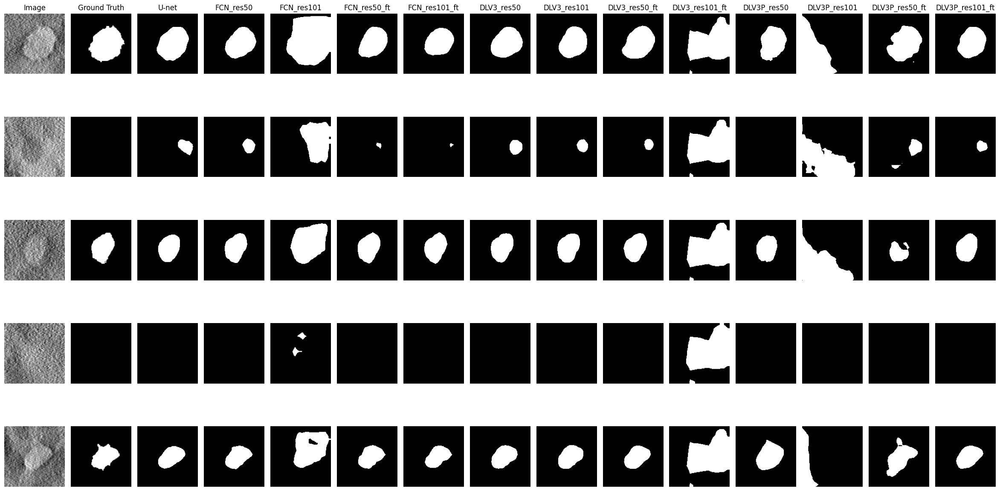

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    # Coloca los modelos en modo evaluación
    unet_model.eval()
    model_fcn50.eval()
    model_fcn101.eval()
    model_fcn50_ft.eval()
    model_fcn101_ft.eval()
    model_deeplab50.eval()
    model_deeplab101.eval()
    model_deeplab50_ft.eval()
    model_deeplab101_ft.eval()
    model_deeplabv3plus50.eval()
    model_deeplabv3plus101.eval()
    model_deeplabv3plus50_ft.eval()
    model_deeplabv3plus101_ft.eval()

    # Predicciones de los modelos
    unet_pred = unet_model(batch[0])
    fcn50_pred = model_fcn50(batch[0])
    fcn101_pred = model_fcn101(batch[0])
    fcn50_ft_pred = model_fcn50_ft(batch[0])
    fcn101_ft_pred = model_fcn101_ft(batch[0])
    deeplab50_pred = model_deeplab50(batch[0])
    deeplab101_pred = model_deeplab101(batch[0])
    deeplab50_ft_pred = model_deeplab50_ft(batch[0])
    deeplab101_ft_pred = model_deeplab101_ft(batch[0])
    deeplabv3plus50_pred = model_deeplabv3plus50(batch[0])
    deeplabv3plus101_pred = model_deeplabv3plus101(batch[0])
    deeplabv3plus50_ft_pred = model_deeplabv3plus50_ft(batch[0])
    deeplabv3plus101_ft_pred = model_deeplabv3plus101_ft(batch[0])

    # Convertir logits a máscaras binarias
    unet_masks = (unet_pred > 0.5).float()
    fcn50_masks = (fcn50_pred > 0.5).float()
    fcn101_masks = (fcn101_pred > 0.5).float()
    fcn50_ft_masks = (fcn50_ft_pred > 0.5).float()
    fcn101_ft_masks = (fcn101_ft_pred > 0.5).float()
    deeplab50_masks = (deeplab50_pred > 0.5).float()
    deeplab101_masks = (deeplab101_pred > 0.5).float()
    deeplab50_ft_masks = (deeplab50_ft_pred > 0.5).float()
    deeplab101_ft_masks = (deeplab101_ft_pred > 0.5).float()
    deeplabv3plus50_masks = (deeplabv3plus50_pred > 0.5).float()
    deeplabv3plus101_masks = (deeplabv3plus101_pred > 0.5).float()
    deeplabv3plus50_ft_masks = (deeplabv3plus50_ft_pred > 0.5).float()
    deeplabv3plus101_ft_masks = (deeplabv3plus101_ft_pred > 0.5).float()

# Número de filas y columnas a mostrar
num_rows = 5
num_cols = 15  # Una columna para cada modelo + imagen y ground truth

# Crear una figura con subplots, ajustada para 14 columnas
fig, axs = plt.subplots(num_rows, num_cols, figsize=(30, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "U-net", "FCN_res50", "FCN_res101", "FCN_res50_ft", "FCN_res101_ft",
          "DLV3_res50", "DLV3_res101", "DLV3_res50_ft", "DLV3_res101_ft",
          "DLV3P_res50", "DLV3P_res101", "DLV3P_res50_ft", "DLV3P_res101_ft"]

# Mostrar imágenes, ground truth y predicciones
for i in range(num_rows):
    image, gt_mask = batch[0][i], batch[1][i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno (ground truth)
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Predicciones de cada modelo
    axs[i, 2].imshow(unet_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    axs[i, 3].imshow(fcn50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 3].axis("off")

    axs[i, 4].imshow(fcn101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 4].axis("off")

    axs[i, 5].imshow(fcn50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 5].axis("off")

    axs[i, 6].imshow(fcn101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 6].axis("off")

    axs[i, 7].imshow(deeplab50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 7].axis("off")

    axs[i, 8].imshow(deeplab101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 8].axis("off")

    axs[i, 9].imshow(deeplab50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 9].axis("off")

    axs[i, 10].imshow(deeplab101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 10].axis("off")

    axs[i, 11].imshow(deeplabv3plus50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 11].axis("off")

    axs[i, 12].imshow(deeplabv3plus101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 12].axis("off")

    axs[i, 13].imshow(deeplabv3plus50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 13].axis("off")

    axs[i, 14].imshow(deeplabv3plus101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 14].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Guardar la figura en formatos PNG y PDF
plt.savefig('all_models_results.png', bbox_inches='tight')
plt.savefig('all_models_results.pdf', bbox_inches='tight')
plt.show()


In [ ]:
# prompt: zip models folder

!zip -r /content/models.zip /content/models


  adding: content/models/ (stored 0%)
  adding: content/models/unet-epoch=34-valid_f1_score=0.85.ckpt (deflated 7%)
  adding: content/models/deepv350plus_pretrained-epoch=74-valid_f1_score=0.74.ckpt


zip error: Interrupted (aborting)


In [ ]:
# prompt: move all csv in results folder

!mkdir -p results
!mv *.csv results/


In [ ]:
# prompt: create zip from results folder

!zip -r /content/results.zip /content/results


  adding: content/results/ (stored 0%)
  adding: content/results/fcn101_pretrained_test_metrics.csv (deflated 31%)
  adding: content/results/deeplabv3plus50_test_metrics.csv (deflated 32%)
  adding: content/results/fcn50_test_metrics.csv (deflated 34%)
  adding: content/results/deeplabv3101_pretrained_test_metrics.csv (deflated 32%)
  adding: content/results/deeplabv350_test_metrics.csv (deflated 33%)
  adding: content/results/deeplabv3101_test_metrics.csv (deflated 33%)
  adding: content/results/deeplabv3plus101_pretrained_test_metrics.csv (deflated 32%)
  adding: content/results/fcn101_test_metrics.csv (deflated 33%)
  adding: content/results/fcn50_pretrained_test_metrics.csv (deflated 31%)
  adding: content/results/unet_test_metrics.csv (deflated 35%)
  adding: content/results/deeplabv3plus50_pretrained_test_metrics.csv (deflated 32%)
  adding: content/results/deeplabv3plus101_test_metrics.csv (deflated 32%)
  adding: content/results/deeplabv350_pretrained_test_metrics.csv (deflated

In [ ]:
unet_modelo = UNETModel.load_from_checkpoint(checkpoint_path="/content/models/unet-epoch=34-valid_f1_score=0.85.ckpt")

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


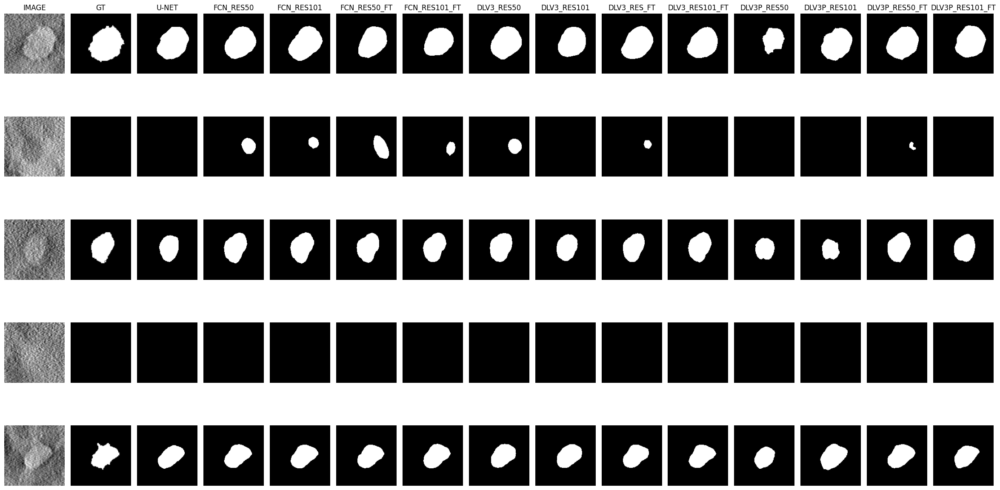

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

unet_model = UNETModel.load_from_checkpoint(checkpoint_path="/content/models/unet-epoch=34-valid_f1_score=0.85.ckpt").to(device)
model_fcn50 = FCN50.load_from_checkpoint(checkpoint_path="/content/models/fcn50-epoch=59-valid_f1_score=0.76.ckpt").to(device)
model_fcn101 = FCN101.load_from_checkpoint(checkpoint_path="/content/models/fcn101-epoch=61-valid_f1_score=0.76.ckpt").to(device)
model_fcn50_ft = FCN50P.load_from_checkpoint(checkpoint_path="/content/models/fcn50pretrained-epoch=33-valid_f1_score=0.76.ckpt").to(device)
model_fcn101_ft = FCN101P.load_from_checkpoint(checkpoint_path="/content/models/fcn101pretrained-epoch=21-valid_f1_score=0.74.ckpt").to(device)
model_deeplab50 = DeepLabv350.load_from_checkpoint(checkpoint_path="/content/models/deeplabv350-epoch=33-valid_f1_score=0.77.ckpt").to(device)
model_deeplab101 = DeepLabv3101.load_from_checkpoint(checkpoint_path="/content/models/deeplabv3101-epoch=16-valid_f1_score=0.77.ckpt").to(device)
model_deeplab50_ft = DeepLabv350P.load_from_checkpoint(checkpoint_path="/content/models/deeplabv350_pretrained-epoch=29-valid_f1_score=0.81.ckpt").to(device)
model_deeplab101_ft = DeepLabv3101P.load_from_checkpoint(checkpoint_path="/content/models/deeplabv3101_pretrained-epoch=63-valid_f1_score=0.78.ckpt").to(device)
model_deeplabv3plus50 = DeepLabv3plus50.load_from_checkpoint(checkpoint_path="/content/models/deeplabv350plus-epoch=30-valid_f1_score=0.68.ckpt").to(device)
model_deeplabv3plus101 = DeepLabv3plus101.load_from_checkpoint(checkpoint_path="/content/models/deepv3101plus-epoch=67-valid_f1_score=0.72.ckpt").to(device)
model_deeplabv3plus50_ft = DeepLabv3plus50P.load_from_checkpoint(checkpoint_path="/content/models/deepv350plus_pretrained-epoch=74-valid_f1_score=0.74.ckpt").to(device)
model_deeplabv3plus101_ft = DeepLabv3plus101P.load_from_checkpoint(checkpoint_path="/content/models/deepv3101plus_pretrained-epoch=18-valid_f1_score=0.75.ckpt").to(device)
# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    # Coloca los modelos en modo evaluación
    unet_model.eval()
    model_fcn50.eval()
    model_fcn101.eval()
    model_fcn50_ft.eval()
    model_fcn101_ft.eval()
    model_deeplab50.eval()
    model_deeplab101.eval()
    model_deeplab50_ft.eval()
    model_deeplab101_ft.eval()
    model_deeplabv3plus50.eval()
    model_deeplabv3plus101.eval()
    model_deeplabv3plus50_ft.eval()
    model_deeplabv3plus101_ft.eval()

    # Predicciones de los modelos
    unet_pred = unet_model(batch[0].to(device))
    fcn50_pred = model_fcn50(batch[0].to(device))
    fcn101_pred = model_fcn101(batch[0].to(device))
    fcn50_ft_pred = model_fcn50_ft(batch[0].to(device))
    fcn101_ft_pred = model_fcn101_ft(batch[0].to(device))
    deeplab50_pred = model_deeplab50(batch[0].to(device))
    deeplab101_pred = model_deeplab101(batch[0].to(device))
    deeplab50_ft_pred = model_deeplab50_ft(batch[0].to(device))
    deeplab101_ft_pred = model_deeplab101_ft(batch[0].to(device))
    deeplabv3plus50_pred = model_deeplabv3plus50(batch[0].to(device))
    deeplabv3plus101_pred = model_deeplabv3plus101(batch[0].to(device))
    deeplabv3plus50_ft_pred = model_deeplabv3plus50_ft(batch[0].to(device))
    deeplabv3plus101_ft_pred = model_deeplabv3plus101_ft(batch[0].to(device))

    # Convertir logits a máscaras binarias
    unet_masks = (unet_pred > 0.5).float()
    fcn50_masks = (fcn50_pred > 0.5).float()
    fcn101_masks = (fcn101_pred > 0.5).float()
    fcn50_ft_masks = (fcn50_ft_pred > 0.5).float()
    fcn101_ft_masks = (fcn101_ft_pred > 0.5).float()
    deeplab50_masks = (deeplab50_pred > 0.5).float()
    deeplab101_masks = (deeplab101_pred > 0.5).float()
    deeplab50_ft_masks = (deeplab50_ft_pred > 0.5).float()
    deeplab101_ft_masks = (deeplab101_ft_pred > 0.5).float()
    deeplabv3plus50_masks = (deeplabv3plus50_pred > 0.5).float()
    deeplabv3plus101_masks = (deeplabv3plus101_pred > 0.5).float()
    deeplabv3plus50_ft_masks = (deeplabv3plus50_ft_pred > 0.5).float()
    deeplabv3plus101_ft_masks = (deeplabv3plus101_ft_pred > 0.5).float()

# Número de filas y columnas a mostrar
num_rows = 5
num_cols = 15  # Una columna para cada modelo + imagen y ground truth

# Crear una figura con subplots, ajustada para 14 columnas
fig, axs = plt.subplots(num_rows, num_cols, figsize=(30, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["IMAGE", "GT", "U-NET", "FCN_RES50", "FCN_RES101", "FCN_RES50_FT", "FCN_RES101_FT",
          "DLV3_RES50", "DLV3_RES101", "DLV3_RES_FT", "DLV3_RES101_FT",
          "DLV3P_RES50", "DLV3P_RES101", "DLV3P_RES50_FT", "DLV3P_RES101_FT"]

# Mostrar imágenes, ground truth y predicciones
for i in range(num_rows):
    image, gt_mask = batch[0][i], batch[1][i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno (ground truth)
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Predicciones de cada modelo
    axs[i, 2].imshow(unet_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    axs[i, 3].imshow(fcn50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 3].axis("off")

    axs[i, 4].imshow(fcn101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 4].axis("off")

    axs[i, 5].imshow(fcn50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 5].axis("off")

    axs[i, 6].imshow(fcn101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 6].axis("off")

    axs[i, 7].imshow(deeplab50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 7].axis("off")

    axs[i, 8].imshow(deeplab101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 8].axis("off")

    axs[i, 9].imshow(deeplab50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 9].axis("off")

    axs[i, 10].imshow(deeplab101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 10].axis("off")

    axs[i, 11].imshow(deeplabv3plus50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 11].axis("off")

    axs[i, 12].imshow(deeplabv3plus101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 12].axis("off")

    axs[i, 13].imshow(deeplabv3plus50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 13].axis("off")

    axs[i, 14].imshow(deeplabv3plus101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 14].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Guardar la figura en formatos PNG y PDF
plt.savefig('all_models_results.png', bbox_inches='tight')
plt.savefig('all_models_results.pdf', bbox_inches='tight')
plt.show()


In [ ]:
from google.colab import files
files.download('/content/models.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Reimportar librerías necesarias para la ejecución correcta
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Datos de la tabla con F1-score y IoU
data = {
    'Model': [
        'U-NET', 'FCN resnet50', 'FCN resnet101', 'FCN50 Pretrained',
        'FCN101 Pretrained', 'DeepLabv3 resnet50', 'DeepLabv3 resnet101',
        'DeepLabv350 finetuned', 'DeepLabv3101 Pretrained', 'DeepLabv3plus resnet50',
        'DeepLabv3plus resnet101', 'DeepLabv3plus50 Pretrained', 'DeepLabv3plus101 Pretrained'
    ],
    'F1-score': [
        0.9222, 0.9073, 0.9080, 0.8696, 0.8871, 0.9095, 0.9076,
        0.8884, 0.8977, 0.8486, 0.8308, 0.9004, 0.8940
    ],
    'IoU': [
        0.8219, 0.8323, 0.8500, 0.7726, 0.7778, 0.8293, 0.7993,
        0.9171, 0.8089, 0.7106, 0.7213, 0.8046, 0.8102
    ]
}

# Convertir los datos a un DataFrame
df = pd.DataFrame(data)

# Análisis ANOVA para F1-score y IoU
# Primero creamos una variable dependiente (stacked data)
stacked_data = df.melt(id_vars='Model', value_vars=['F1-score', 'IoU'], var_name='Metric', value_name='Value')

# Aplicamos la prueba ANOVA (para ambas métricas agrupadas)
anova_model = sm.stats.anova_lm(sm.OLS.from_formula('Value ~ Metric + Model', data=stacked_data).fit(), typ=2)

# Comparaciones múltiples (Post-Hoc) usando Tukey HSD para cada métrica individual
tukey_f1 = pairwise_tukeyhsd(endog=df['F1-score'], groups=df['Model'], alpha=0.05)
tukey_iou = pairwise_tukeyhsd(endog=df['IoU'], groups=df['Model'], alpha=0.05)

# Mostrar resultados
anova_model, tukey_f1.summary(), tukey_iou.summary()


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


(            sum_sq    df          F    PR(>F)
 Metric    0.047842   1.0  60.994505  0.000005
 Model     0.032755  12.0   3.479959  0.020004
 Residual  0.009412  12.0        NaN       NaN,
 <class 'statsmodels.iolib.table.SimpleTable'>,
 <class 'statsmodels.iolib.table.SimpleTable'>)

In [ ]:
# Crear un DataFrame a partir del CSV proporcionado
import pandas as pd

# Datos del CSV
data = {
    'Model': ['U-NET', 'FCN resnet50', 'FCN resnet101', 'FCN50 Pretrained', 'FCN101 Pretrained',
              'DeepLabv3 resnet50', 'DeepLabv3 resnet101', 'DeepLabv350 finetuned',
              'DeepLabv3101 Pretrained', 'DeepLabv3plus resnet50', 'DeepLabv3plus resnet101',
              'DeepLabv3plus50 Pretrained', 'DeepLabv3plus101 Pretrained'],
    'F1-score': [0.9222, 0.9073, 0.908, 0.8696, 0.8871, 0.9095, 0.9076, 0.8884, 0.8977, 0.8486,
                 0.8308, 0.9004, 0.894],
    'IoU': [0.8219, 0.8323, 0.85, 0.7726, 0.7778, 0.8293, 0.7993, 0.9171, 0.8089, 0.7106,
            0.7213, 0.8046, 0.8102],
    'Precision': [0.8947, 0.9261, 0.9266, 0.915, 0.9226, 0.9179, 0.903, 0.9026, 0.8906, 0.7989,
                 0.8655, 0.8877, 0.878],
    'Recall': [0.9514, 0.8894, 0.8901, 0.8285, 0.8543, 0.9012, 0.9121, 0.7933, 0.9049, 0.905,
               0.7988, 0.9135, 0.9106]
}

# Crear el DataFrame
df_metrics = pd.DataFrame(data)

# Mostrar el DataFrame resultante
df_metrics


,Model,F1-score,IoU,Precision,Recall
0,U-NET,0.9222,0.8219,0.8947,0.9514
1,FCN resnet50,0.9073,0.8323,0.9261,0.8894
2,FCN resnet101,0.9080,0.8500,0.9266,0.8901
3,FCN50 Pretrained,0.8696,0.7726,0.9150,0.8285
4,FCN101 Pretrained,0.8871,0.7778,0.9226,0.8543
5,DeepLabv3 resnet50,0.9095,0.8293,0.9179,0.9012
6,DeepLabv3 resnet101,0.9076,0.7993,0.9030,0.9121
7,DeepLabv350 finetuned,0.8884,0.9171,0.9026,0.7933
8,DeepLabv3101 Pretrained,0.8977,0.8089,0.8906,0.9049
9,DeepLabv3plus resnet50,0.8486,0.7106,0.7989,0.9050


In [ ]:
# Realizar la prueba de Kruskal-Wallis para F1-score e IoU entre todos los modelos

from scipy.stats import kruskal

# Kruskal-Wallis para F1-score e IoU
kruskal_f1 = kruskal(*[df_metrics[df_metrics['Model'] == model]['F1-score'] for model in df_metrics['Model'].unique()])
kruskal_iou = kruskal(*[df_metrics[df_metrics['Model'] == model]['IoU'] for model in df_metrics['Model'].unique()])

# Mostrar los resultados
kruskal_f1, kruskal_iou


(KruskalResult(statistic=12.0, pvalue=0.44567964136461097),
 KruskalResult(statistic=12.0, pvalue=0.44567964136461097))

In [ ]:

from statsmodels.stats.multicomp import MultiComparison
import scipy.stats as stats # import the stats submodule from scipy

# Corrección de Bonferroni para F1-score
mc_f1 = MultiComparison(df_metrics['F1-score'], df_metrics['Model'])
result_f1 = mc_f1.allpairtest(stats.ttest_ind, method='bonferroni')

# Corrección de Bonferroni para IoU
mc_iou = MultiComparison(df_metrics['IoU'], df_metrics['Model'])
result_iou = mc_iou.allpairtest(stats.ttest_ind, method='bonferroni')

# Mostrar los resultados
result_f1, result_iou

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:6951: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df


((<class 'statsmodels.iolib.table.SimpleTable'>,
  (array([[nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
          [nan, nan],
     